In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Loading Cityscapes dataset...
Cityscapes dataset loaded!
Loading Dark Zurich samples...
Loaded Dark Zurich image: /kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/GOPR0376/GOPR0376_frame_000001_rgb_anon.png
Loaded Dark Zurich image: /kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/GOPR0376/GOPR0376_frame_000023_rgb_anon.png
Loaded Dark Zurich image: /kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/GP010376/GP010376_frame_000010_rgb_anon.png
Loaded Dark Zurich image: /kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/GOPR0351/GOPR0351_frame_000003_rgb_anon.png
Loaded Dark Zurich image: /kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/GP010376/GP010376_frame_000018_rgb_anon.png
Loaded 5 Dark Zurich images
Applying domain adaptation and color transfer...
Generating visualization...


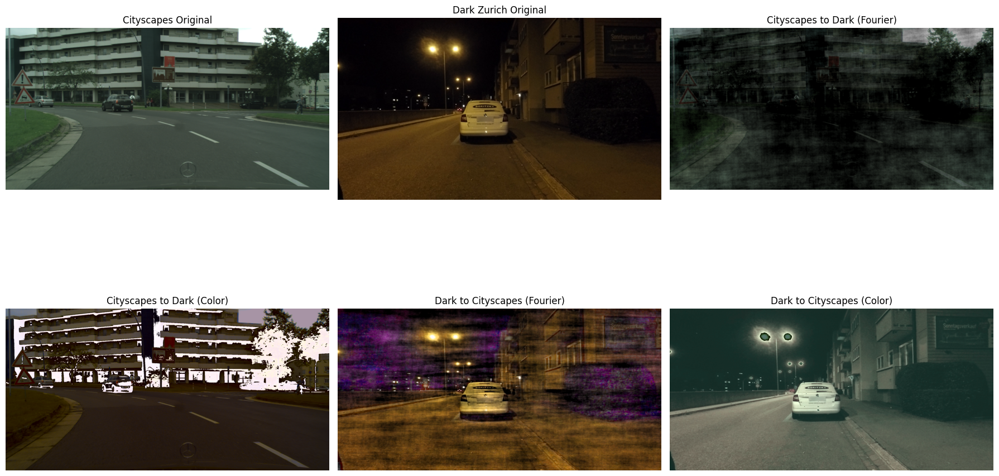

<Figure size 640x480 with 0 Axes>

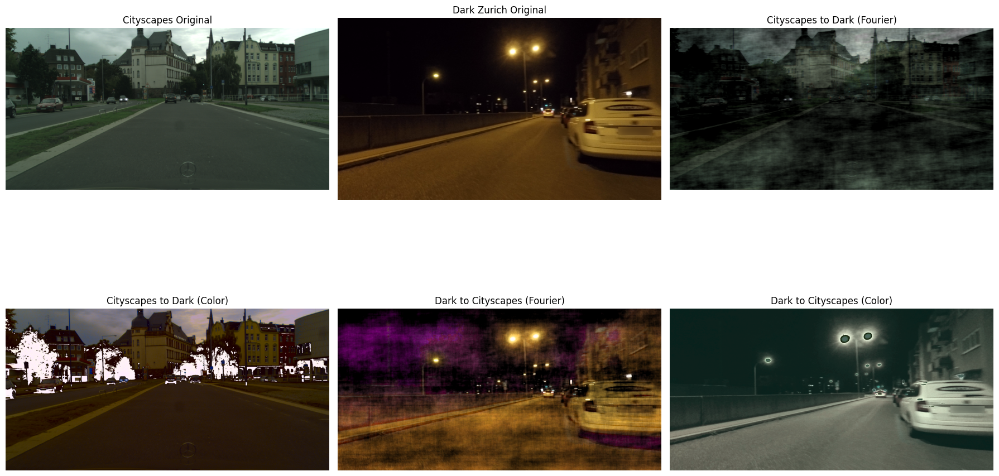

<Figure size 640x480 with 0 Axes>

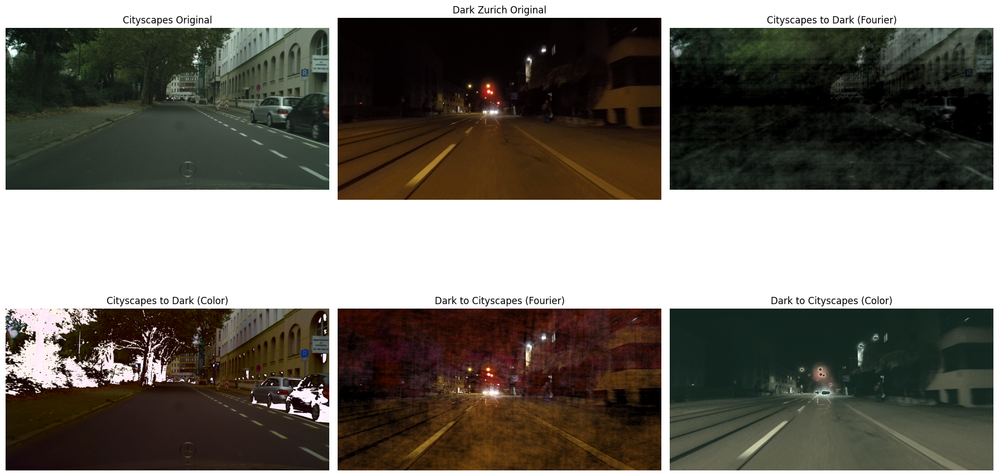

<Figure size 640x480 with 0 Axes>

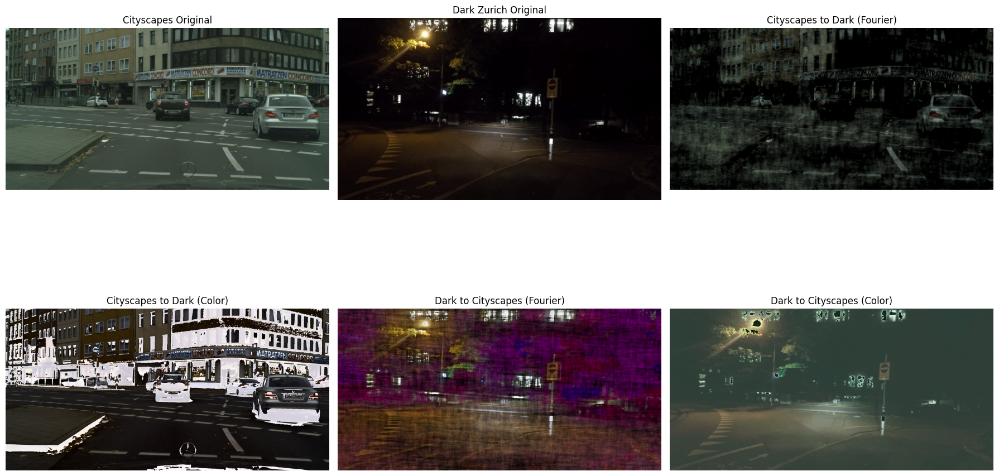

<Figure size 640x480 with 0 Axes>

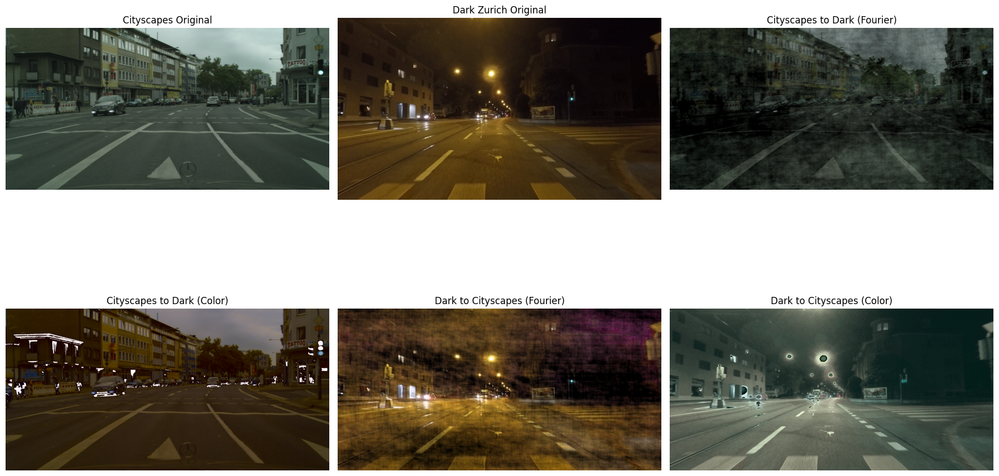

Process completed! Results saved as domain_adaptation_results_*.png


<Figure size 640x480 with 0 Axes>

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset
import cv2
from sklearn.cluster import KMeans
import requests
from io import BytesIO
from PIL import Image
import os
import torch
import torch.nn.functional as F

# Function to load Dark Zurich dataset from Kaggle path
def get_dark_zurich_samples(n=5):
    base_path = "/kaggle/input/dark-zurich/Dark_Zurich_train_anon/rgb_anon/train/night/"
    
    # Generate file paths for 5 consecutive frames starting from the one provided
    file_patterns = [
        "GOPR0376/GOPR0376_frame_000001_rgb_anon.png",
        "GOPR0376/GOPR0376_frame_000023_rgb_anon.png",
        "GP010376/GP010376_frame_000010_rgb_anon.png",
        "GOPR0351/GOPR0351_frame_000003_rgb_anon.png",
        "GP010376/GP010376_frame_000018_rgb_anon.png",
    ]
    
    dark_zurich_images = []
    for i, filename in enumerate(file_patterns[:n]):
        try:
            img_path = os.path.join(base_path, filename)
            if os.path.exists(img_path):
                img = cv2.imread(img_path)
                # Convert from BGR to RGB (OpenCV loads as BGR)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                dark_zurich_images.append(img)
                print(f"Loaded Dark Zurich image: {img_path}")
            else:
                print(f"File not found: {img_path}")
        except Exception as e:
            print(f"Error loading Dark Zurich image: {e}")
    
    return dark_zurich_images

# Load Cityscapes dataset
print("Loading Cityscapes dataset...")
cityscapes = load_dataset("Chris1/cityscapes")
print("Cityscapes dataset loaded!")

# Get 5 sample images from Cityscapes
cityscapes_images = []
for i in range(5):
    img = cityscapes['train'][i]['image']
    img_array = np.array(img)
    cityscapes_images.append(img_array)

# Get 5 sample images from Dark Zurich
print("Loading Dark Zurich samples...")
dark_zurich_images = get_dark_zurich_samples(5)
print(f"Loaded {len(dark_zurich_images)} Dark Zurich images")

# Function to visualize images
def visualize_images(images, titles, rows, cols, figsize=(15, 10)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles)):
        if rows == 1:
            ax = axes[i]
        else:
            ax = axes[i // cols, i % cols]
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    return fig

# Fourier Domain Adaptation
def fourier_domain_adaptation(source, target):
    """
    Apply Fourier domain adaptation from source to target.
    """
    # Convert to grayscale for FFT
    source_gray = cv2.cvtColor(source, cv2.COLOR_RGB2GRAY).astype(np.float32)
    target_gray = cv2.cvtColor(target, cv2.COLOR_RGB2GRAY).astype(np.float32)
    
    # Apply FFT
    source_fft = np.fft.fft2(source_gray)
    target_fft = np.fft.fft2(target_gray)
    
    # Get amplitude and phase
    source_amp, source_phase = np.abs(source_fft), np.angle(source_fft)
    target_amp, target_phase = np.abs(target_fft), np.angle(target_fft)
    
    # Create adapted FFT (source phase with target amplitude)
    adapted_fft = target_amp * np.exp(1j * source_phase)
    
    # Apply inverse FFT
    adapted_image = np.fft.ifft2(adapted_fft).real
    
    # Normalize to [0, 255]
    adapted_image = np.clip(adapted_image, 0, 255).astype(np.uint8)
    
    # Convert back to color by preserving hue from source
    source_hsv = cv2.cvtColor(source, cv2.COLOR_RGB2HSV)
    adapted_hsv = source_hsv.copy()
    
    # Replace V channel with adapted image
    adapted_hsv[:, :, 2] = adapted_image
    
    # Convert back to RGB
    result = cv2.cvtColor(adapted_hsv, cv2.COLOR_HSV2RGB)
    
    return result

# Color Transfer using Mean and Standard Deviation in Lab Color Space
def color_transfer(source, target):
    """
    Transfer the color distribution from target to source.
    """
    # Convert from RGB to Lab color space
    source_lab = cv2.cvtColor(source, cv2.COLOR_RGB2LAB).astype(np.float32)
    target_lab = cv2.cvtColor(target, cv2.COLOR_RGB2LAB).astype(np.float32)
    
    # Calculate mean and standard deviation for each channel
    source_mean, source_std = [], []
    target_mean, target_std = [], []
    
    for i in range(3):
        source_mean.append(np.mean(source_lab[:, :, i]))
        source_std.append(np.std(source_lab[:, :, i]))
        target_mean.append(np.mean(target_lab[:, :, i]))
        target_std.append(np.std(target_lab[:, :, i]))
    
    # Apply the transfer for each channel
    result_lab = source_lab.copy()
    for i in range(3):
        result_lab[:, :, i] = ((result_lab[:, :, i] - source_mean[i]) * 
                              (target_std[i] / source_std[i])) + target_mean[i]
    
    # Convert back to RGB color space
    result = cv2.cvtColor(result_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)
    
    return result

# Process the images
results_cityscapes_to_dark = []
results_dark_to_cityscapes = []

print("Applying domain adaptation and color transfer...")

# Process each pair of images
for i in range(min(len(cityscapes_images), len(dark_zurich_images))):
    # Ensure both images have the same dimensions for processing
    cityscapes_img = cityscapes_images[i]
    dark_zurich_img = dark_zurich_images[i]
    
    # Resize Dark Zurich to match Cityscapes dimensions if needed
    if cityscapes_img.shape[:2] != dark_zurich_img.shape[:2]:
        dark_zurich_img = cv2.resize(dark_zurich_img, 
                                    (cityscapes_img.shape[1], cityscapes_img.shape[0]),
                                    interpolation=cv2.INTER_LINEAR)
    
    # Cityscapes to Dark Zurich
    fourier_c2d = fourier_domain_adaptation(cityscapes_img, dark_zurich_img)
    color_c2d = color_transfer(cityscapes_img, dark_zurich_img)
    
    # Dark Zurich to Cityscapes
    fourier_d2c = fourier_domain_adaptation(dark_zurich_img, cityscapes_img)
    color_d2c = color_transfer(dark_zurich_img, cityscapes_img)
    
    results_cityscapes_to_dark.append((fourier_c2d, color_c2d))
    results_dark_to_cityscapes.append((fourier_d2c, color_d2c))

# Visualize results
print("Generating visualization...")

# Create a figure for each pair of images
for i in range(min(len(cityscapes_images), len(dark_zurich_images))):
    cityscapes_img = cityscapes_images[i]
    dark_zurich_img = dark_zurich_images[i]
    fourier_c2d, color_c2d = results_cityscapes_to_dark[i]
    fourier_d2c, color_d2c = results_dark_to_cityscapes[i]
    
    images = [cityscapes_img, dark_zurich_img, 
              fourier_c2d, color_c2d, 
              fourier_d2c, color_d2c]
    
    titles = ["Cityscapes Original", "Dark Zurich Original",
              "Cityscapes to Dark (Fourier)", "Cityscapes to Dark (Color)",
              "Dark to Cityscapes (Fourier)", "Dark to Cityscapes (Color)"]
    
    fig = visualize_images(images, titles, rows=2, cols=3, figsize=(18, 12))
    plt.show()  # Display the figure
    plt.savefig(f"domain_adaptation_results_{i+1}.png")
    plt.close(fig)

print("Process completed! Results saved as domain_adaptation_results_*.png")